In [1]:
import numpy as np
import pandas as pd
from pandas.plotting import parallel_coordinates

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.svm import SVC
from sklearn.decomposition import PCA
import itertools

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
sns.set_style("white")

---
## Exploratory Data Analysis on Iris Dataset
---

In [4]:
irisdf = pd.read_csv('iris.csv')
irisdf.head()

,sepal_length,sepal_width,petal_length,petal_width,label
0,5.1,3.5,1.4,0.2,Iris-setosa
1,4.9,3.0,1.4,0.2,Iris-setosa
2,4.7,3.2,1.3,0.2,Iris-setosa
3,4.6,3.1,1.5,0.2,Iris-setosa
4,5.0,3.6,1.4,0.2,Iris-setosa


In [5]:
irisdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   sepal_length  150 non-null    float64
 1   sepal_width   150 non-null    float64
 2   petal_length  150 non-null    float64
 3   petal_width   150 non-null    float64
 4   label         150 non-null    object 
dtypes: float64(4), object(1)
memory usage: 6.0+ KB


In [6]:
irisdf.describe()

,sepal_length,sepal_width,petal_length,petal_width
count,150.000000,150.000000,150.000000,150.000000
mean,5.843333,3.054000,3.758667,1.198667
std,0.828066,0.433594,1.764420,0.763161
min,4.300000,2.000000,1.000000,0.100000
25%,5.100000,2.800000,1.600000,0.300000
50%,5.800000,3.000000,4.350000,1.300000
75%,6.400000,3.300000,5.100000,1.800000
max,7.900000,4.400000,6.900000,2.500000


In [7]:
irisdf.isnull().sum()

sepal_length    0
sepal_width     0
petal_length    0
petal_width     0
label           0
dtype: int64

#### The dataset did not contain any missing values.

In [8]:
irisdf.label.unique()

array(['Iris-setosa', 'Iris-versicolor', 'Iris-virginica'], dtype=object)

#### There are **three** iris flower categories (species): **Setosa**, **Versicolor**, and **Virginica**.

In [9]:
irisdf.label.value_counts()

label
Iris-setosa        50
Iris-versicolor    50
Iris-virginica     50
Name: count, dtype: int64

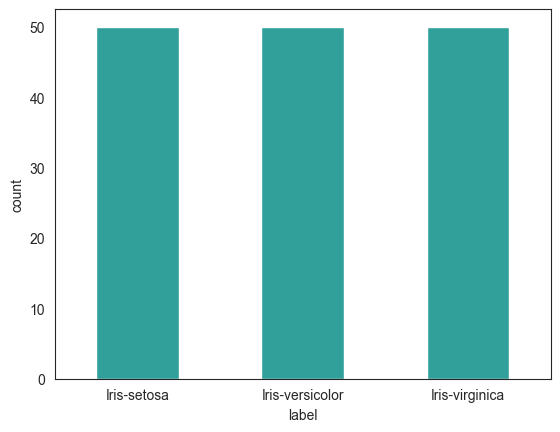

In [10]:
sns.countplot(x='label', data=irisdf, color='lightseagreen', width=0.5)
plt.show()

#### The dataset contains equal number of datapoints for each class (species), i.e., the dataset is perfectly balanced.

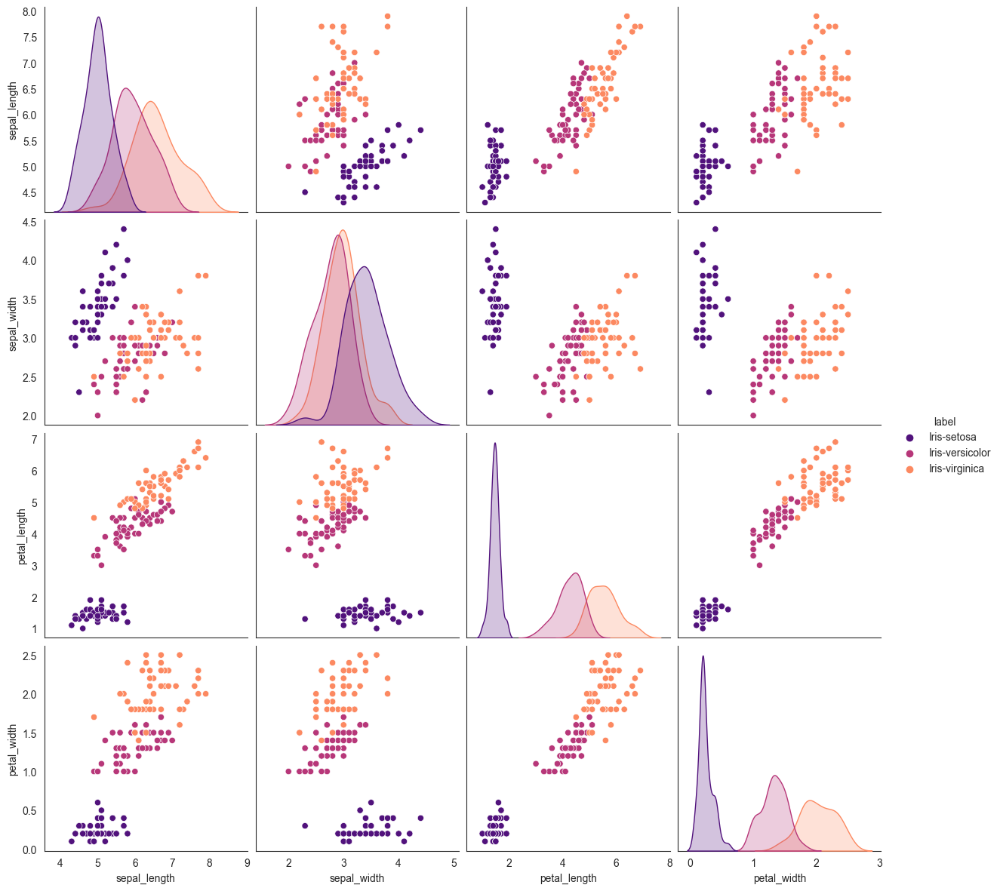

In [11]:
sns.pairplot(irisdf, hue='label', size=3, palette='magma')
plt.show()

#### Observations
- `petal length` and `petal width` features are able to distinguish the species more clearly as compared to the others.
- **Setosa** have larger sepal width but smaller sepal length.
- **Viriginica** have smaller sepal width but larger sepal length.
- **Setosa** have smaller petal width and petal length.
- **Viriginica** has smaller petal width and petal length.
- **Versicolor** lies in the middle of the other two in terms of petal length and petal width.

In [12]:
iris_features = irisdf.columns.tolist()[:-1]

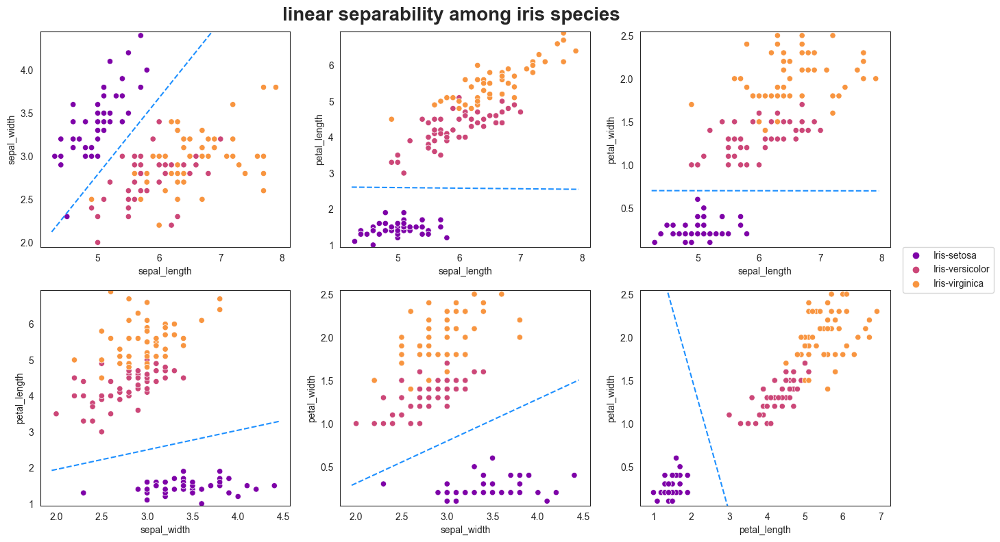

In [13]:
tempiris = irisdf.copy()
tempiris.label = [0 if each=='Iris-setosa' else 1 for each in tempiris.label]

fig, ax = plt.subplots(2, 3, figsize=(16,9))

for idx, pair in enumerate(itertools.combinations(iris_features, 2)):
    X_train = tempiris[list(pair)]
    y_train = tempiris.label
    clf = SVC(kernel='linear')
    clf.fit(X_train, y_train)
    x_line = np.linspace(X_train[pair[0]].min()-0.05, X_train[pair[0]].max()+0.05, 20)
    y_line = (-1 * clf.intercept_ - clf.coef_[0][0] * x_line) / clf.coef_[0][1]
    
    sns.scatterplot(irisdf, x=pair[0], y=pair[1], hue='label', palette='plasma', ax=ax[idx//3][idx%3], legend=True if idx==5 else False)
    ax[idx//3][idx%3].plot(x_line, y_line, '--', c='dodgerblue')
    ax[idx//3][idx%3].set_ylim(X_train[pair[1]].min()-0.05, X_train[pair[1]].max()+0.05)
    if idx == 5:
        ax[idx//3][idx%3].legend(bbox_to_anchor=(1.05, 1.2), loc='upper left', borderaxespad=0)

fig.suptitle('linear separability among iris species', fontsize=20, fontweight='bold', y=0.92)
fig.show()

### **Setosa** species is linearly separable (can be easily distinguised) from the other two species (**Versicolor** and **Virginica**) which have some overlaps.

In [14]:
iris_features

['sepal_length', 'sepal_width', 'petal_length', 'petal_width']

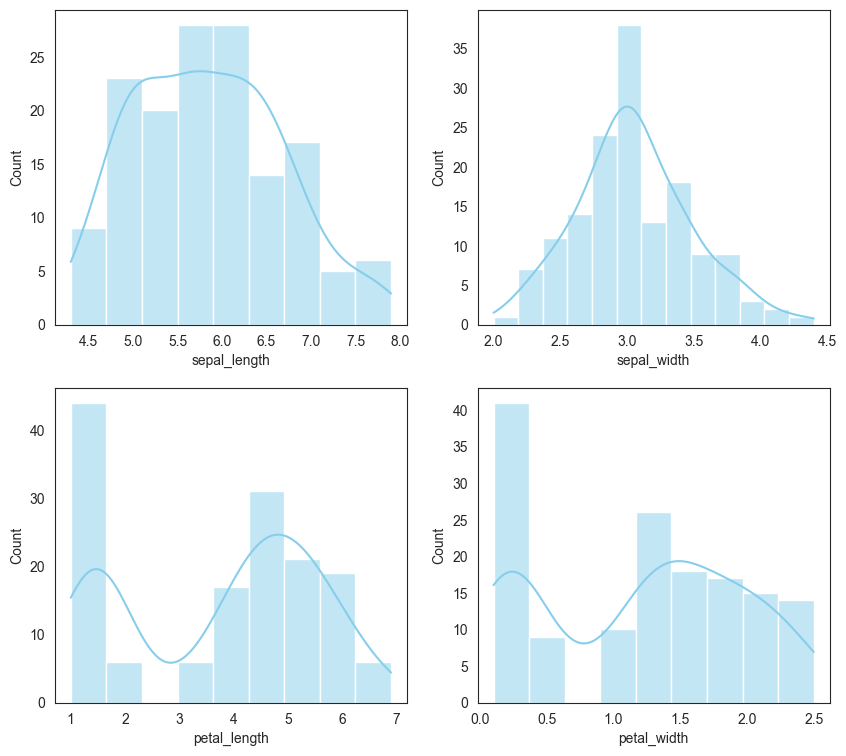

In [15]:
fig, ax = plt.subplots(2, 2, figsize=(10,9))
for each in range(len(iris_features)):
    sns.histplot(irisdf, x=iris_features[each], kde=True, ax=ax[each//2][each%2], color='skyblue')
plt.show()

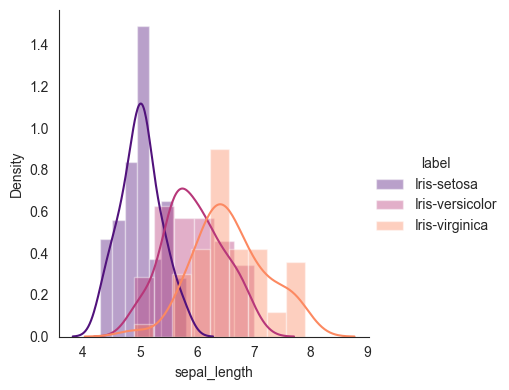

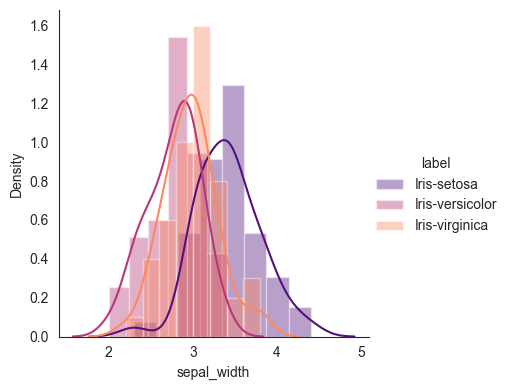

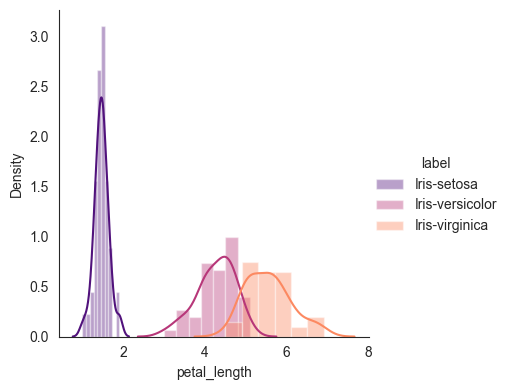

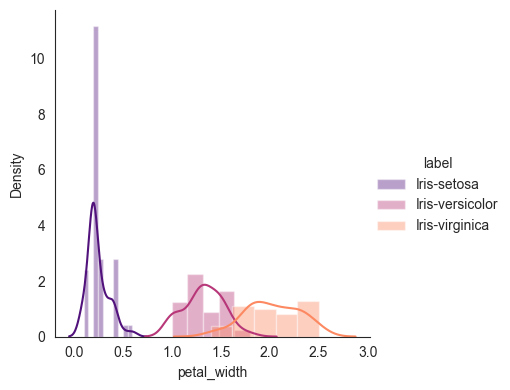

In [16]:
for each in range(len(iris_features)):
    sns.FacetGrid(irisdf, hue='label', height=4, palette='magma').map(sns.distplot, iris_features[each]).add_legend()
plt.show()

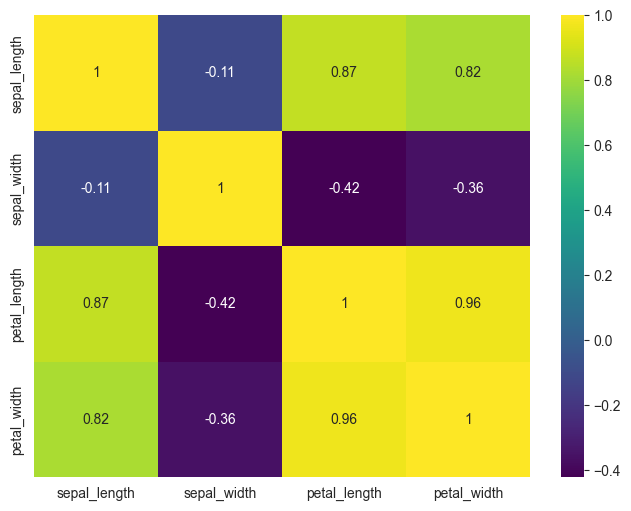

In [17]:
fig, ax = plt.subplots(figsize=(8,6))
sns.heatmap(irisdf.drop('label', axis=1).corr(method='pearson'), annot=True, cmap='viridis')
plt.show()

#### The features (`petal length` & `petal width`) showed very high correlation (almost 1), followed by high correlation among (`petal length` & `sepal length`) and (`petal width` & `sepal length`).

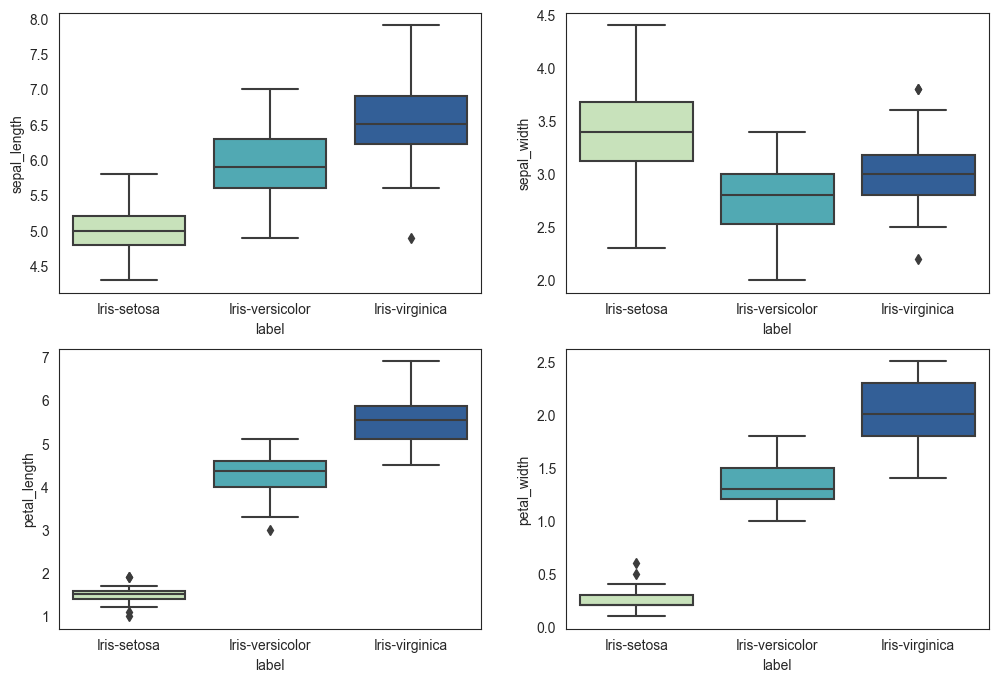

In [18]:
fig, ax = plt.subplots(2, 2, figsize=(12,8))
for each in range(len(iris_features)):
    sns.boxplot(y=iris_features[each], x='label', data=irisdf, ax=ax[each//2][each%2], palette='YlGnBu')
plt.show()

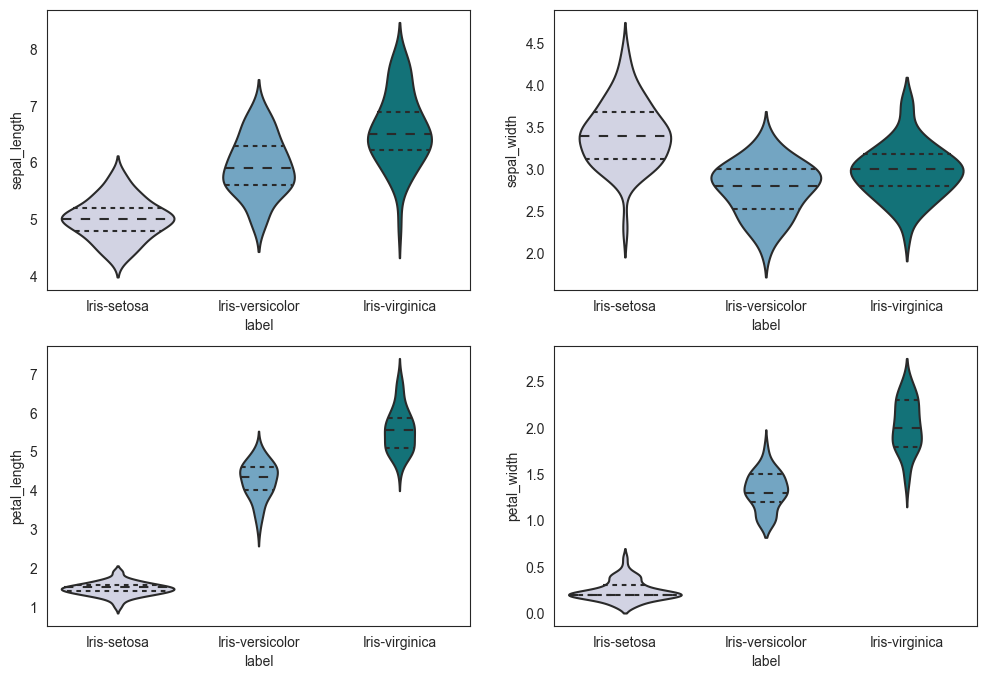

In [19]:
fig, ax = plt.subplots(2, 2, figsize=(12,8))
for each in range(len(iris_features)):
    sns.violinplot(y=iris_features[each], x='label', data=irisdf, ax=ax[each//2][each%2], palette='PuBuGn', inner='quartile')
plt.show()

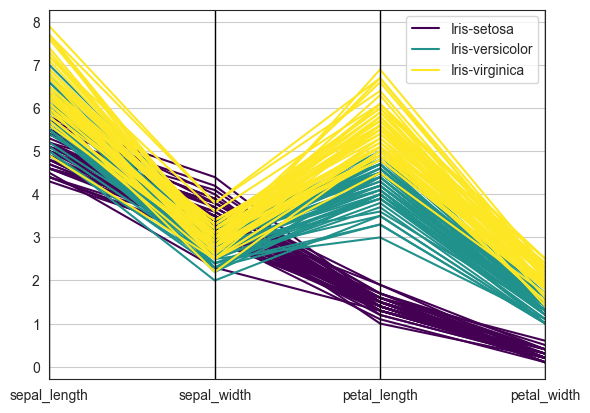

In [20]:
parallel_coordinates(irisdf, "label", colormap='viridis')
plt.show()

---
## Exploratory Data Analysis of Wine Quality Dataset
---

In [21]:
winedf = pd.read_csv('wine.csv')
winedf.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Id
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,1
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,2
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,3
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,4


In [22]:
winedf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1143 entries, 0 to 1142
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1143 non-null   float64
 1   volatile acidity      1143 non-null   float64
 2   citric acid           1143 non-null   float64
 3   residual sugar        1143 non-null   float64
 4   chlorides             1143 non-null   float64
 5   free sulfur dioxide   1143 non-null   float64
 6   total sulfur dioxide  1143 non-null   float64
 7   density               1143 non-null   float64
 8   pH                    1143 non-null   float64
 9   sulphates             1143 non-null   float64
 10  alcohol               1143 non-null   float64
 11  quality               1143 non-null   int64  
 12  Id                    1143 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 116.2 KB


In [23]:
try:
    winedf.drop('Id', axis=1, inplace=True)
except Exception as e:
    print(e)

winedf.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [24]:
winedf.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000
mean,8.311111,0.531339,0.268364,2.532152,0.086933,15.615486,45.914698,0.996730,3.311015,0.657708,10.442111,5.657043
std,1.747595,0.179633,0.196686,1.355917,0.047267,10.250486,32.782130,0.001925,0.156664,0.170399,1.082196,0.805824
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.392500,0.090000,1.900000,0.070000,7.000000,21.000000,0.995570,3.205000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.250000,2.200000,0.079000,13.000000,37.000000,0.996680,3.310000,0.620000,10.200000,6.000000
75%,9.100000,0.640000,0.420000,2.600000,0.090000,21.000000,61.000000,0.997845,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,68.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [25]:
winedf.nunique()

fixed acidity            91
volatile acidity        135
citric acid              77
residual sugar           80
chlorides               131
free sulfur dioxide      53
total sulfur dioxide    138
density                 388
pH                       87
sulphates                89
alcohol                  61
quality                   6
dtype: int64

#### `quality` can be seen as a categorical variable

In [26]:
qualityd = winedf.quality.value_counts().to_dict()
qualityd

{5: 483, 6: 462, 7: 143, 4: 33, 8: 16, 3: 6}

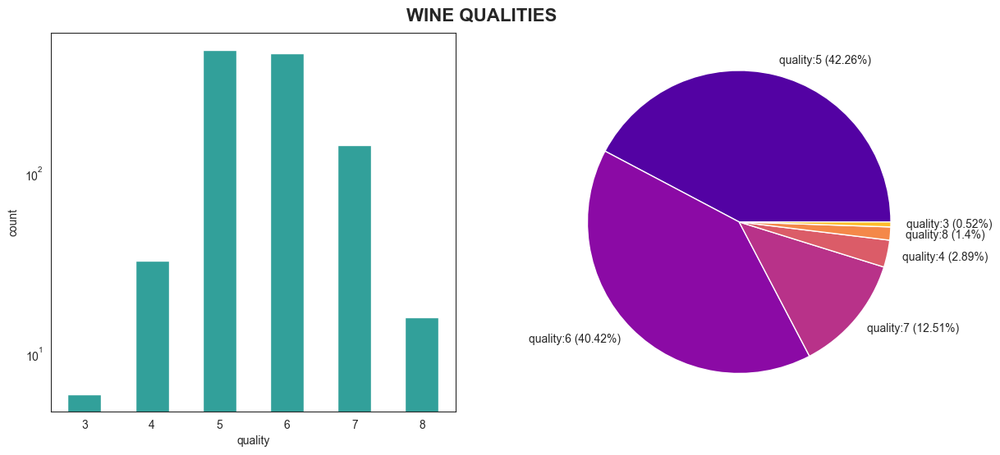

In [27]:
fig, ax = plt.subplots(1, 2, figsize=(14,6))
sns.countplot(x='quality', data=winedf, color='lightseagreen', width=0.5, ax=ax[0])
pie_labels = [f'quality:{each} ({round(qualityd[each]/sum(qualityd.values())*100, 2)}%)' for each in qualityd.keys()]
ax[1].pie(qualityd.values(), labels=pie_labels, colors=sns.color_palette('plasma'))
ax[0].set_yscale('log')
fig.suptitle('wine qualities'.upper(), fontweight='bold', fontsize=16, y=0.93)
plt.show()

#### The dataset is dominated by qualities: 5 and 6, followed by 7 with very small contribution of the remaining.

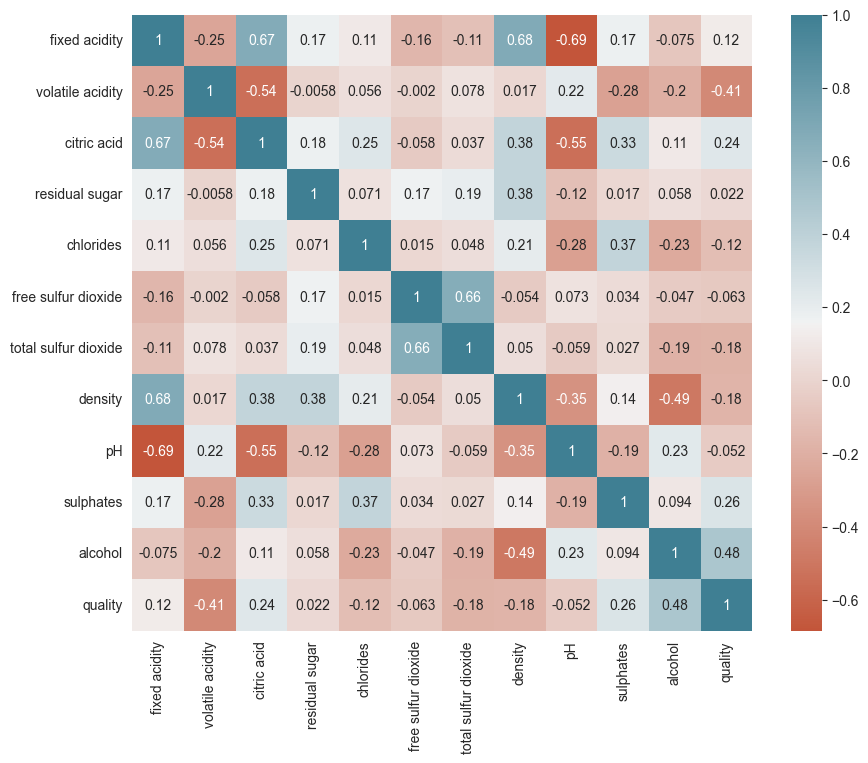

In [28]:
fig, ax = plt.subplots(figsize=(10,8))
sns.heatmap(winedf.corr(method='pearson'), annot=True, cmap=sns.diverging_palette(20, 220, as_cmap=True))
plt.show()

#### Observations
- Significant positive correlation seen in the following pairs: (`fixed acidity`,`citric acid`) and (`fixed acidity`,`density`)
- Significant negative correlation seen in the following pairs: (`fixed acidity`,`pH`), (`volatile acidity`,`citric acid`) and (`citric acid`,`pH`)

In [29]:
wine_cols = winedf.columns.tolist()
wine_features = wine_cols[:-1]
len(wine_cols)

12

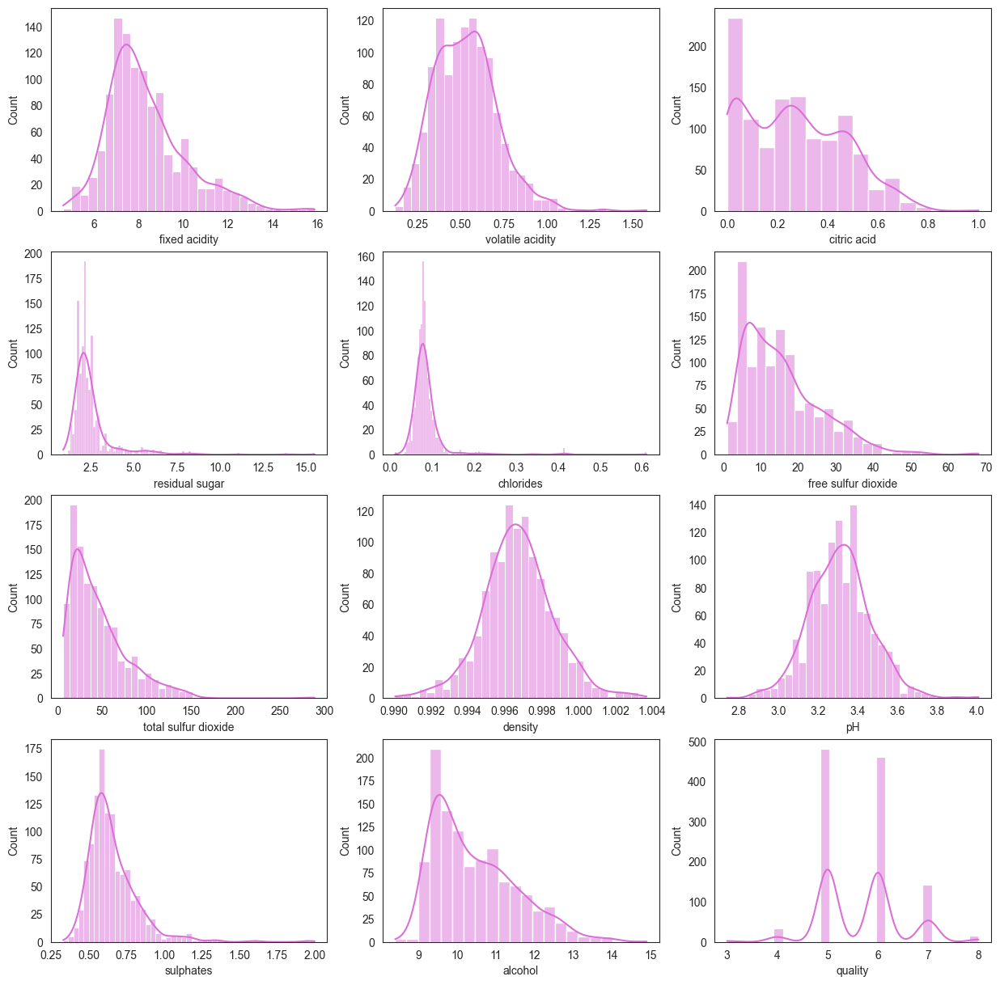

In [30]:
fig, ax = plt.subplots(4, 3, figsize=(15,15))
for each in range(len(wine_cols)):
    sns.histplot(winedf, x=wine_cols[each], kde=True, ax=ax[each//3][each%3], color='orchid')
plt.show()

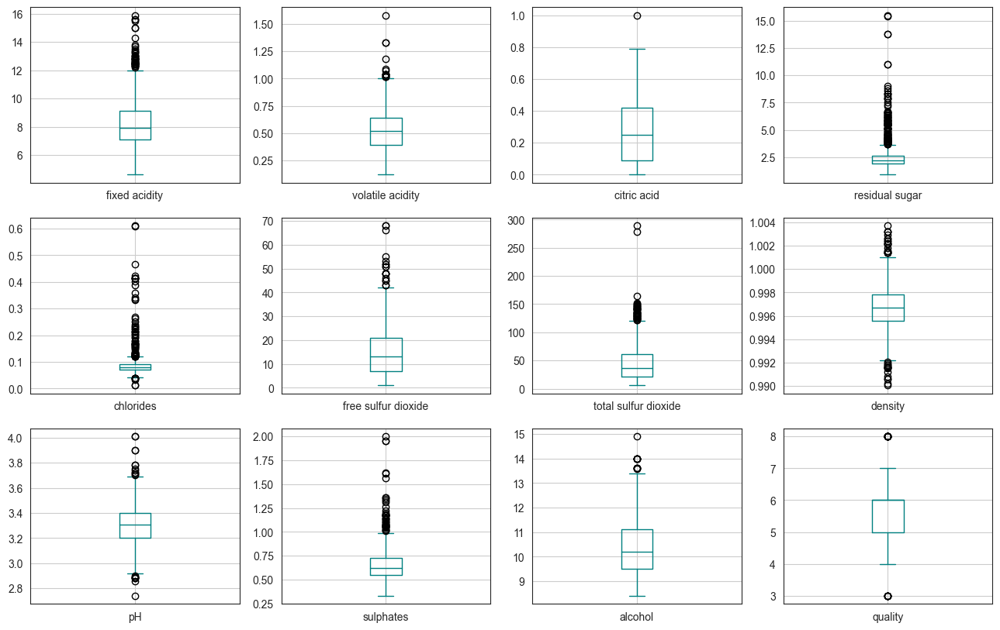

In [31]:
fig, ax = plt.subplots(3, 4, figsize=(16,10))
for each in range(len(wine_cols)):
    winedf.boxplot(wine_cols[each], ax=ax[each//4][each%4], color='teal')

fig.show()

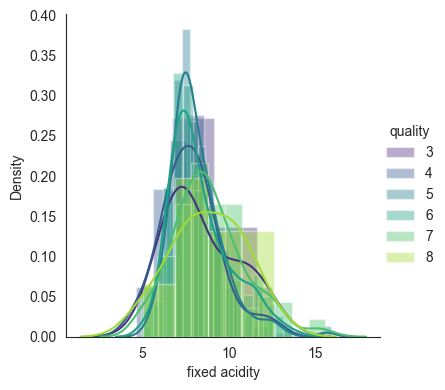

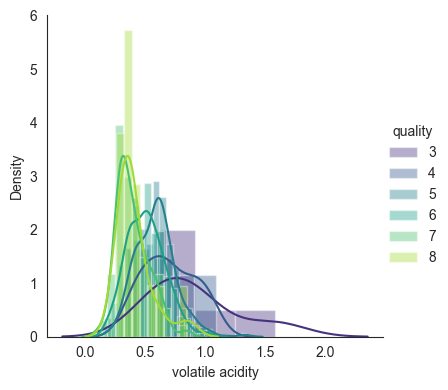

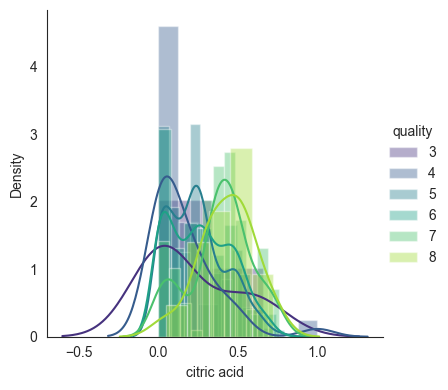

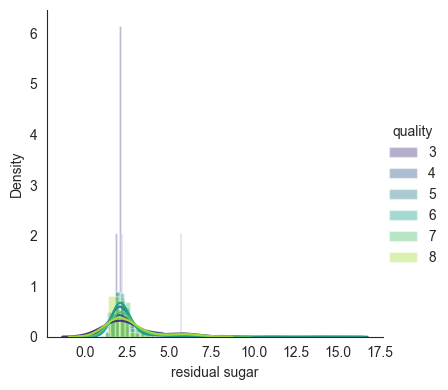

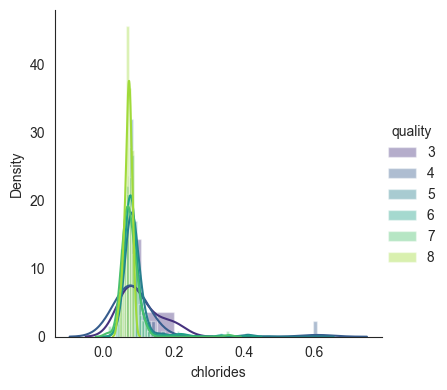

...

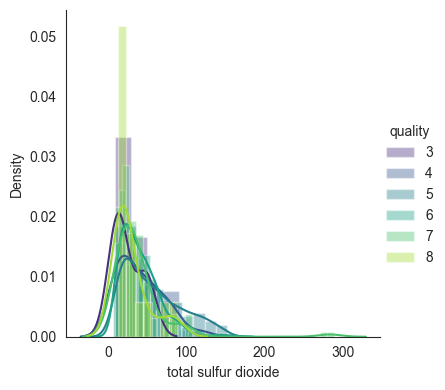

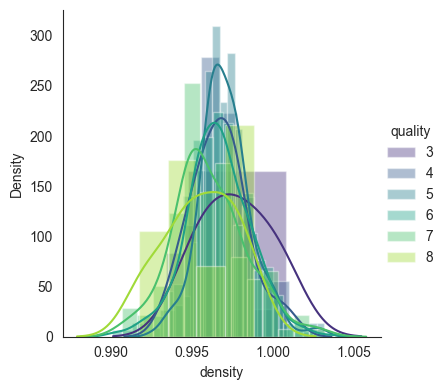

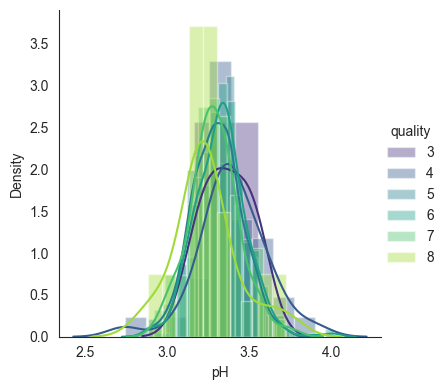

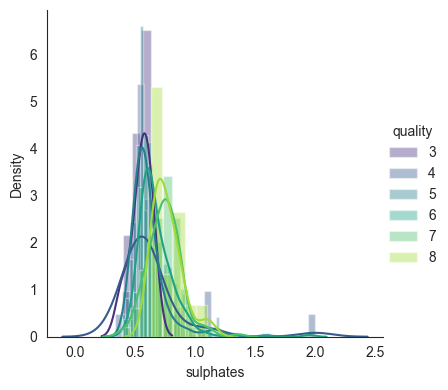

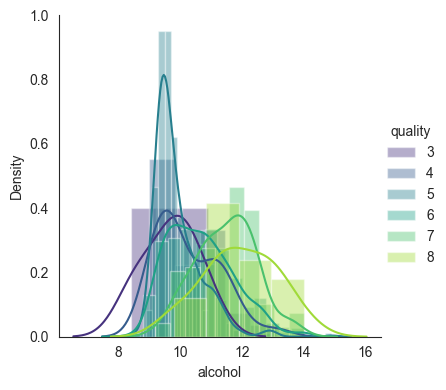

In [32]:
for each in range(len(wine_features)):
    sns.FacetGrid(winedf, hue='quality', height=4, palette='viridis').map(sns.distplot, wine_features[each]).add_legend()
plt.show()

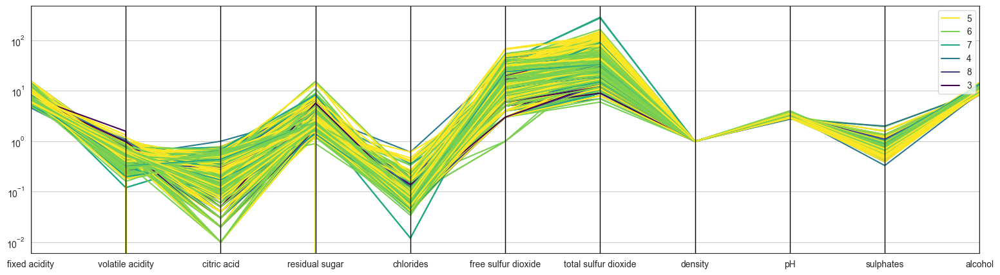

In [33]:
plt.figure(figsize=(19,5))
parallel_coordinates(winedf, "quality", colormap='viridis_r')
plt.yscale('log')
plt.show()

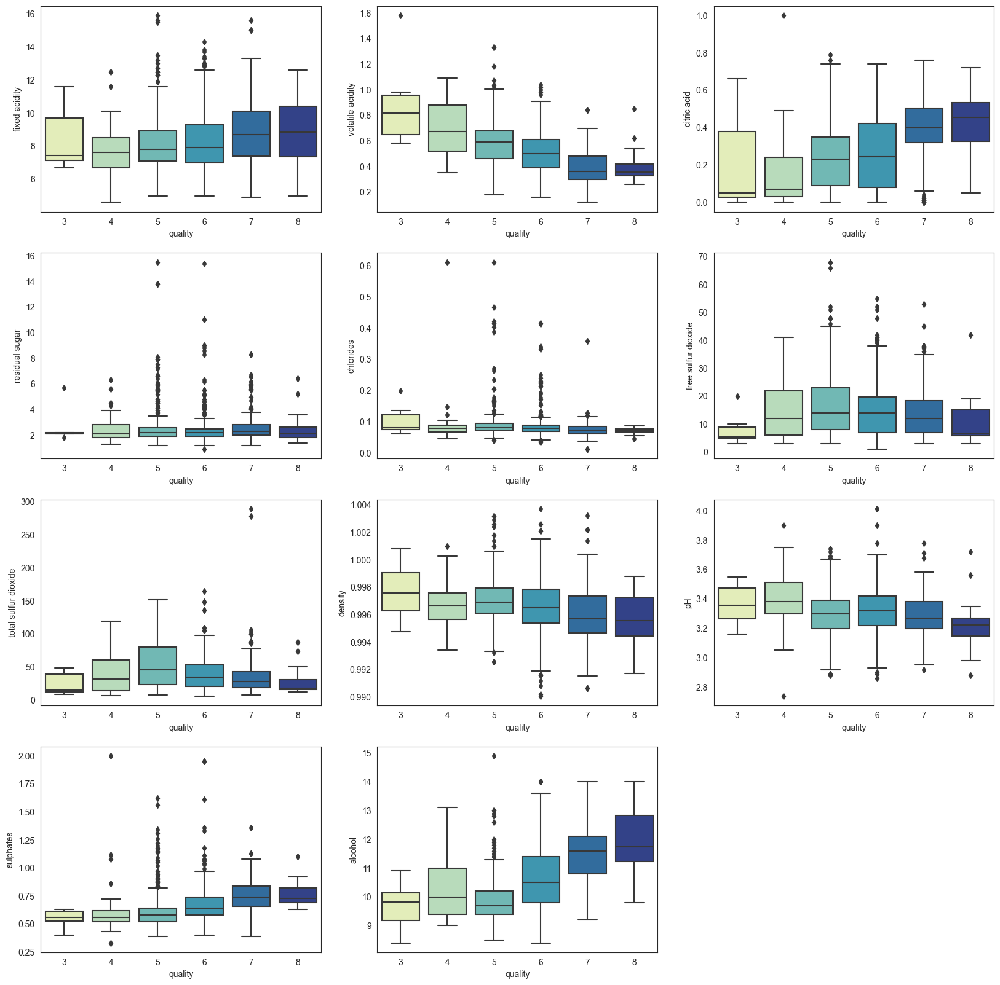

In [34]:
fig, ax = plt.subplots(4, 3, figsize=(20,20))
for each in range(len(wine_features)):
    sns.boxplot(y=wine_features[each], x='quality', data=winedf, ax=ax[each//3][each%3], palette='YlGnBu')
ax[3][2].set_axis_off()
plt.show()

#### Majority of the outliers are in the qualities: 5 and 6, since they group major part of the data.

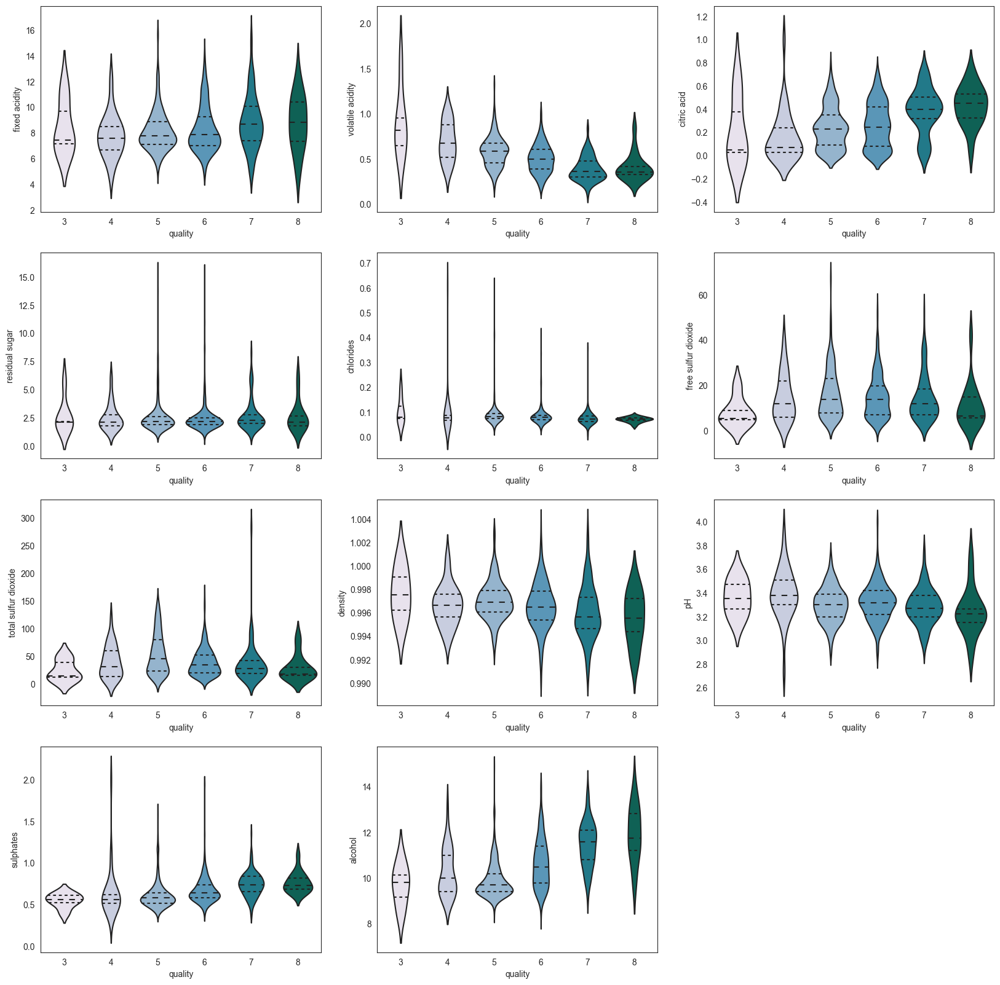

In [35]:
fig, ax = plt.subplots(4, 3, figsize=(20,20))
for each in range(len(wine_features)):
    sns.violinplot(y=wine_features[each], x='quality', data=winedf, ax=ax[each//3][each%3], palette='PuBuGn', inner='quartile')
ax[3][2].set_axis_off()
plt.show()

---
### One-hot encoding the quality categories

In [36]:
onehot_winedf = pd.get_dummies(data=winedf, columns=['quality'], dtype=int)
onehot_winedf.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality_3,quality_4,quality_5,quality_6,quality_7,quality_8
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,0,0,1,0,0,0
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,0,0,1,0,0,0
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,0,0,1,0,0,0
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,0,0,0,1,0,0
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,0,0,1,0,0,0


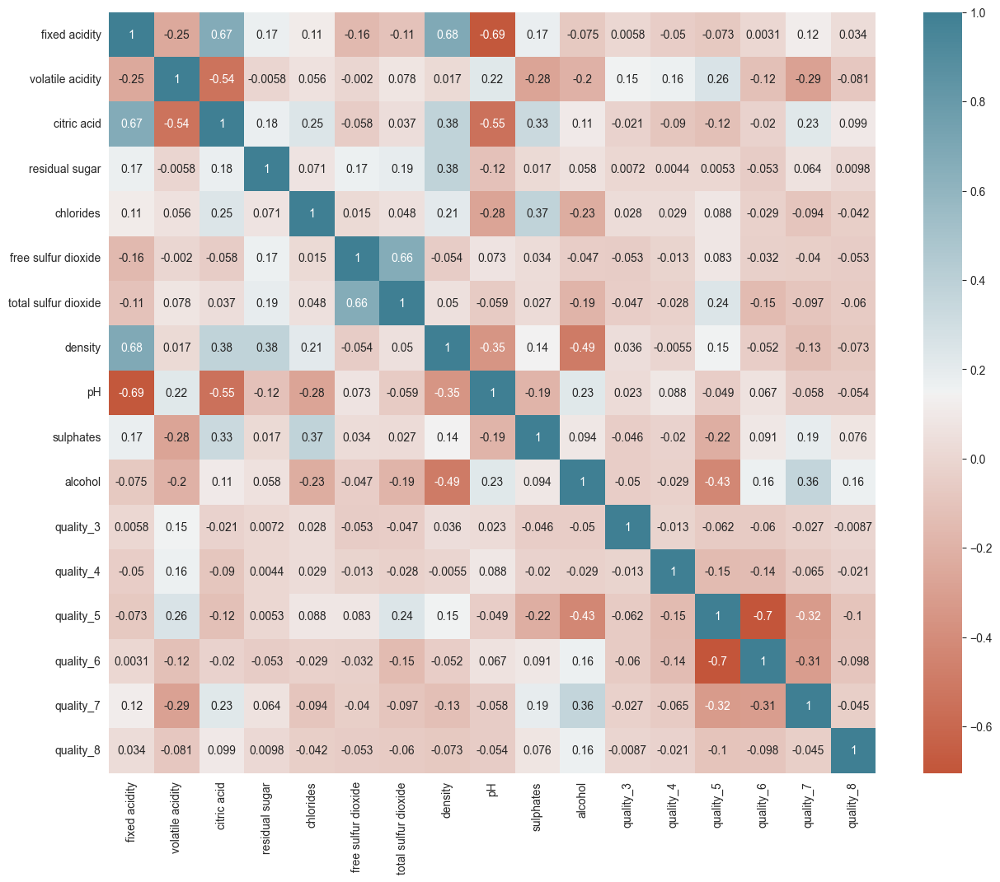

In [37]:
fig, ax = plt.subplots(figsize=(15,12))
sns.heatmap(onehot_winedf.corr(method='pearson'), annot=True, cmap=sns.diverging_palette(20, 220, as_cmap=True))
plt.show()

#### No significant correlation was observed by one-hot encoding the qualities.

---
### Categorizing the wine qualities to: **low, medium, & high** (due to the presence of several overlapping wine qualities)

In [38]:
winedf.quality.unique()

array([5, 6, 7, 4, 8, 3])

In [39]:
def qualcat(x):
    if x < 5:
        return 'low'
    elif x > 6:
        return 'high'
    return 'medium'

In [40]:
cat_winedf = winedf.copy()
cat_winedf['label'] = list(map(qualcat, winedf.quality))
cat_winedf.sample(7)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,label
1062,6.0,0.640,0.05,1.9,0.066,9.0,17.0,0.99496,3.52,0.78,10.6,5,medium
238,8.9,0.430,0.45,1.9,0.052,6.0,16.0,0.99480,3.35,0.70,12.5,6,medium
236,7.9,0.650,0.01,2.5,0.078,17.0,38.0,0.99630,3.34,0.74,11.7,7,high
592,7.5,0.270,0.34,2.3,0.050,4.0,8.0,0.99510,3.40,0.64,11.0,7,high
449,10.1,0.935,0.22,3.4,0.105,11.0,86.0,1.00100,3.43,0.64,11.3,4,low
798,9.1,0.600,0.00,1.9,0.058,5.0,10.0,0.99770,3.18,0.63,10.4,6,medium
747,9.1,0.400,0.50,1.8,0.071,7.0,16.0,0.99462,3.21,0.69,12.5,8,high


In [41]:
tempcatd = cat_winedf.label.value_counts().to_dict()
catd = {}
for each in ['low', 'medium', 'high']:
    catd[each] = tempcatd[each]
catd

{'low': 39, 'medium': 945, 'high': 159}

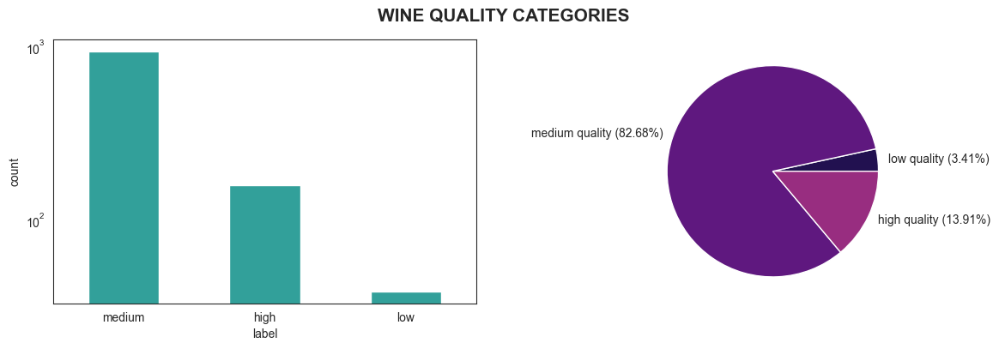

In [42]:
fig, ax = plt.subplots(1, 2, figsize=(14,4))
sns.countplot(x='label', data=cat_winedf, color='lightseagreen', width=0.5, ax=ax[0])
pie_labels = [f'{each} quality ({round(catd[each]/sum(catd.values())*100, 2)}%)' for each in catd.keys()]
ax[1].pie(catd.values(), labels=pie_labels, colors=sns.color_palette('magma'))
ax[0].set_yscale('log')
fig.suptitle('wine quality categories'.upper(), fontweight='bold', fontsize=15, y=0.97)
plt.show()

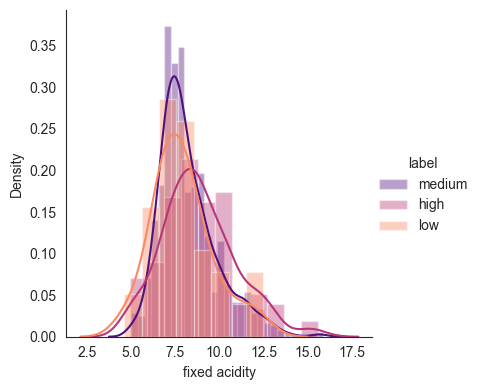

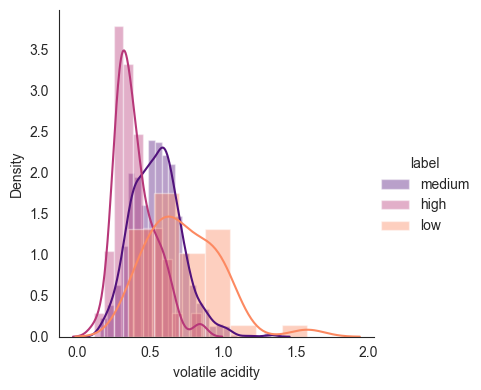

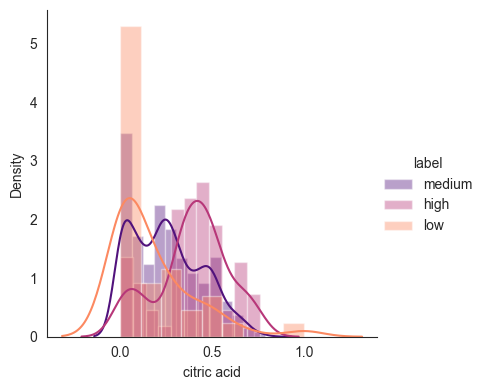

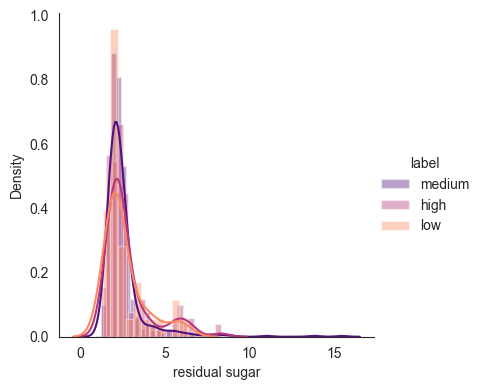

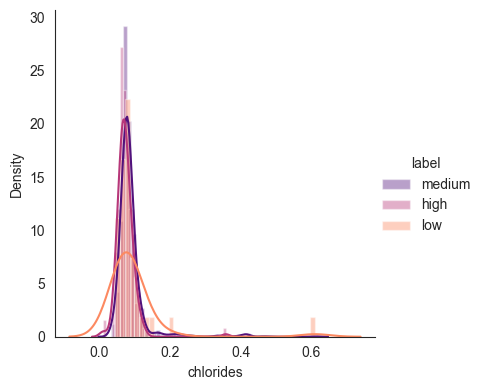

...

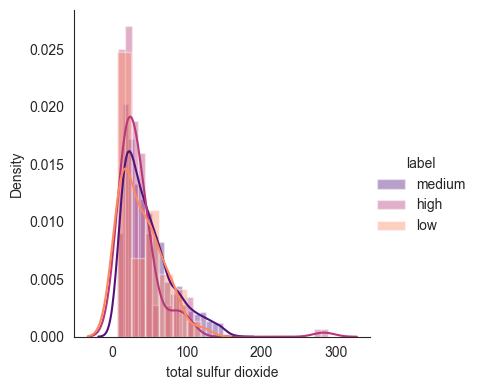

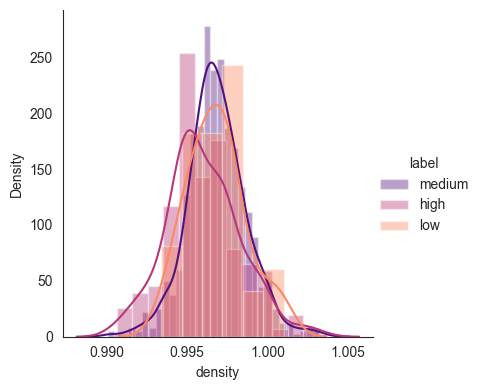

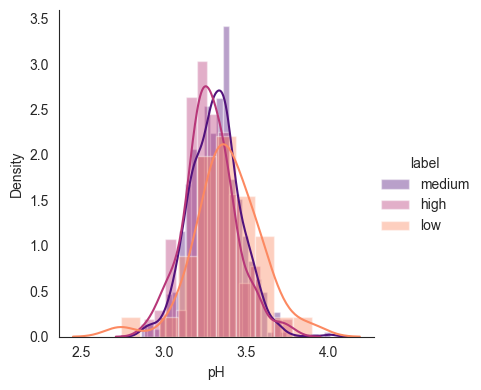

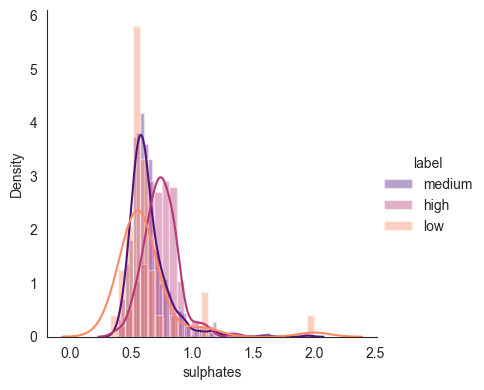

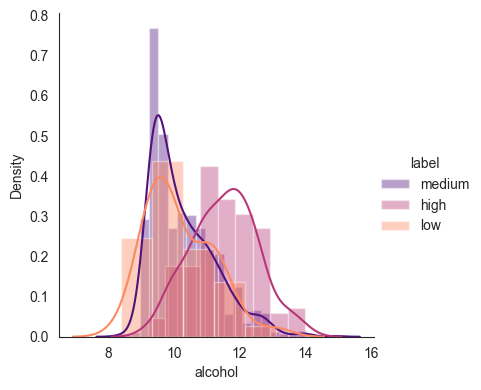

In [43]:
for each in range(len(wine_features)):
    sns.FacetGrid(cat_winedf, hue='label', height=4, palette='magma').map(sns.distplot, wine_features[each]).add_legend()
plt.show()

#### Despite the categorization, the overlapping nature of the curves could not explain any distinctive information.

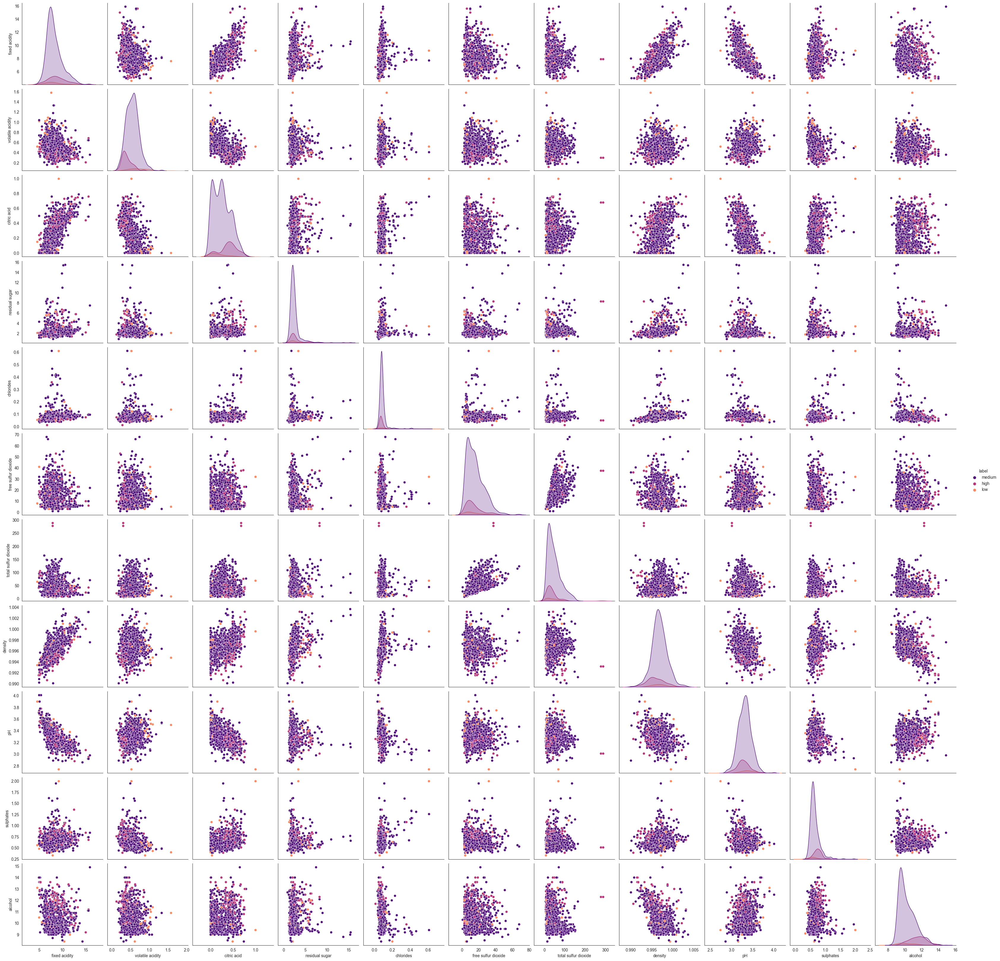

In [44]:
sns.pairplot(cat_winedf.drop('quality', axis=1), hue='label', size=3, palette='magma')
plt.show()

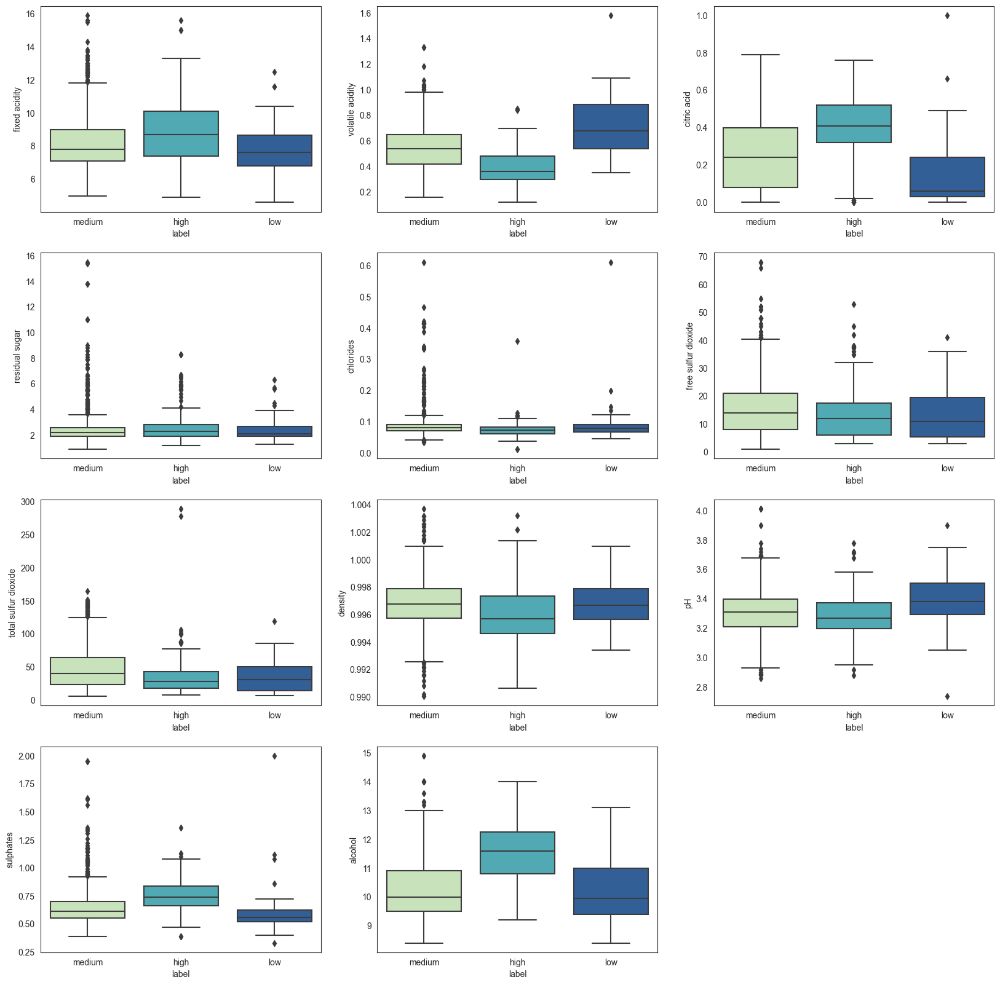

In [45]:
fig, ax = plt.subplots(4, 3, figsize=(20,20))
for each in range(len(wine_features)):
    sns.boxplot(y=wine_features[each], x='label', data=cat_winedf, ax=ax[each//3][each%3], palette='YlGnBu')
ax[3][2].set_axis_off()
plt.show()

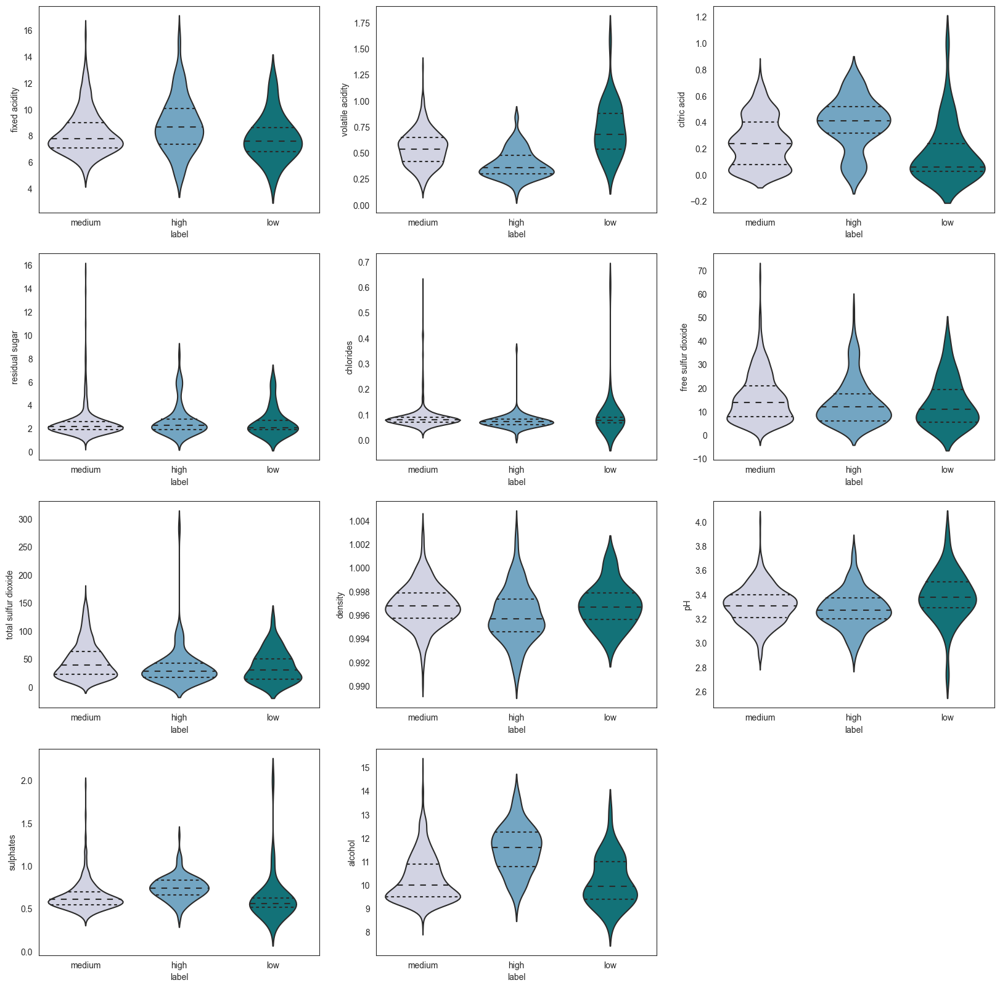

In [46]:
fig, ax = plt.subplots(4, 3, figsize=(20,20))
for each in range(len(wine_features)):
    sns.violinplot(y=wine_features[each], x='label', data=cat_winedf, ax=ax[each//3][each%3], palette='PuBuGn', inner='quartile')
ax[3][2].set_axis_off()
plt.show()

---
### Trying dimensionality reduction on the dataset

In [47]:
winedf.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


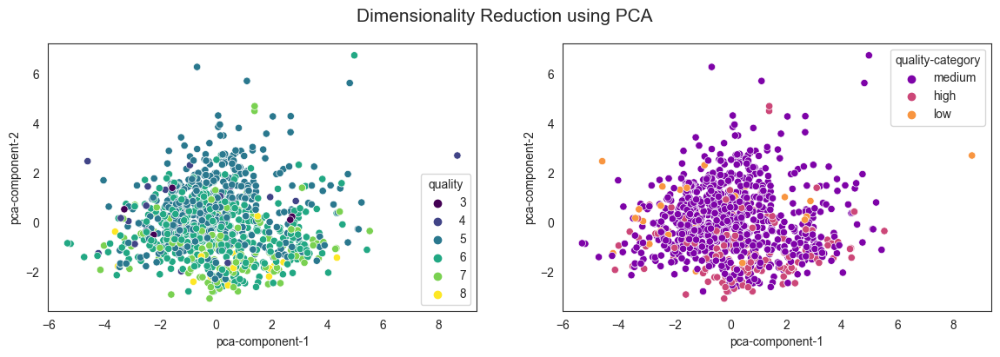

In [48]:
pca = PCA(n_components=2)
sdf = (winedf - winedf.mean())/winedf.std()
tdf = pca.fit_transform(sdf.drop('quality', axis=1))
pdadf = pd.DataFrame(tdf, columns=['pca-component-1', 'pca-component-2'])
pdadf['quality'] = winedf.quality
pdadf['quality-category'] = cat_winedf.label

fig, ax = plt.subplots(1, 2, figsize=(14,4))
sns.scatterplot(data=pdadf, x='pca-component-1', y='pca-component-2', hue='quality', palette='viridis', ax=ax[0])
sns.scatterplot(data=pdadf, x='pca-component-1', y='pca-component-2', hue='quality-category', palette='plasma', ax=ax[1])
fig.suptitle('Dimensionality Reduction using PCA', fontsize=15)
fig.show()

#### No significant observations made from the principal component analysis plots.

---